In [1]:
import sys
import sktime
import tqdm as tq
import xgboost as xgb
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np
print("-------------------------- Python & library version --------------------------")
print("Python version: {}".format(sys.version))
print("pandas version: {}".format(pd.__version__))
print("numpy version: {}".format(np.__version__))
print("matplotlib version: {}".format(matplotlib.__version__))
print("tqdm version: {}".format(tq.__version__))
print("sktime version: {}".format(sktime.__version__))
print("xgboost version: {}".format(xgb.__version__))
print("seaborn version: {}".format(sns.__version__))
print("scikit-learn version: {}".format(skl.__version__))
print("------------------------------------------------------------------------------")

-------------------------- Python & library version --------------------------
Python version: 3.9.13 (tags/v3.9.13:6de2ca5, May 17 2022, 16:36:42) [MSC v.1929 64 bit (AMD64)]
pandas version: 1.5.3
numpy version: 1.23.5
matplotlib version: 3.7.2
tqdm version: 4.65.0
sktime version: 0.21.0
xgboost version: 1.7.6
seaborn version: 0.12.2
scikit-learn version: 1.3.0
------------------------------------------------------------------------------


In [2]:
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor

pd.set_option('display.max_columns', 30)

In [3]:
train = pd.read_csv('./train.csv', encoding='utf-8')

## 변수들을 영문명으로 변경
# cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
# train.columns = cols
train = train.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})

# 시간 관련 변수들 생성
date = pd.to_datetime(train.date_time)
train['hour'] = date.dt.hour
train['day'] = date.dt.weekday
train['month'] = date.dt.month
train['week'] = date.dt.weekofyear

#######################################
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
#######################################
power_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour', 'day'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['day_hour_mean'] = train.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power'].values[0], axis = 1)

#######################################
## 건물별 시간별 발전량 평균 넣어주기
#######################################
power_hour_mean = pd.pivot_table(train, values = 'power', index = ['num', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['hour_mean'] = train.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.num == x['num']) & (power_hour_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

#######################################
## 건물별 시간별 발전량 표준편차 넣어주기
#######################################
power_hour_std = pd.pivot_table(train, values = 'power', index = ['num', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()
train['hour_std'] = train.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) ,'power'].values[0], axis = 1)

### 공휴일 변수 추가
train['holiday'] = train.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
train.loc[('2022-08-15'<=train.date_time)&(train.date_time<'2022-08-16'), 'holiday'] = 1

## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
train['sin_time'] = np.sin(2*np.pi*train.hour/24)
train['cos_time'] = np.cos(2*np.pi*train.hour/24)

## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
train['THI'] = 9/5*train['temp'] - 0.55*(1-train['hum']/100)*(9/5*train['hum']-26)+32



C:\Users\wkdal\AppData\Local\Temp\ipykernel_7972\2937083083.py:23: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  train['week'] = date.dt.weekofyear
100%|██████████| 204000/204000 [01:28<00:00, 2293.74it/s]


In [4]:
def CDH(xs):
    ys = []
    for i in range(len(xs)):
        if i < 11:
            ys.append(np.sum(xs[:(i+1)]-26))
        else:
            ys.append(np.sum(xs[(i-11):(i+1)]-26))
    return np.array(ys)

cdhs = np.array([])
for num in range(1, 101, 1):  # Change the range from 1 to 12 (excluding 12)
    temp = train[train['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
train['CDH'] = cdhs

train.drop(['num_date_time','sun','hour','solar_radiation'], axis = 1, inplace = True)
train.head()

,num,date_time,temp,prec,wind,hum,power,day,month,week,day_hour_mean,hour_mean,hour_std,holiday,sin_time,cos_time,THI,CDH
0,1,20220601 00,18.6,NaN,0.9,42.0,1085.28,2,6,22,1774.744615,1706.318118,446.882767,0,0.000000,1.000000,49.6576,-7.4
1,1,20220601 01,18.0,NaN,1.1,45.0,1047.36,2,6,22,1687.347692,1622.620235,439.662704,0,0.258819,0.965926,47.7625,-15.4
2,1,20220601 02,17.7,NaN,1.5,45.0,974.88,2,6,22,1571.483077,1506.971294,412.071906,0,0.500000,0.866025,47.2225,-23.7
3,1,20220601 03,16.7,NaN,1.4,48.0,953.76,2,6,22,1522.153846,1437.365647,391.205981,0,0.707107,0.707107,44.7856,-33.0
4,1,20220601 04,18.4,NaN,2.8,43.0,986.40,2,6,22,1506.793846,1447.321412,381.099697,0,0.866025,0.500000,49.0061,-40.6


In [5]:
## save the preprocessed data
train.to_csv('./train_preprocessed.csv')

train data shape
x:(1872, 15), y:(1872,)


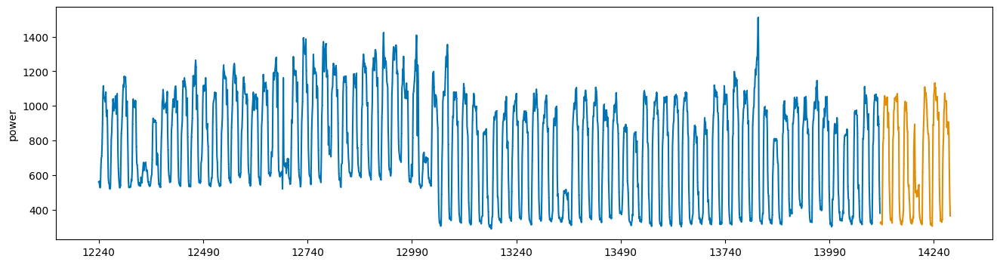

In [6]:
## 7번 건물의 발전량
y = train.loc[train.num == 7, 'power']
x = train.loc[train.num == 7, ].iloc[:, 3:]

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168

print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

In [7]:
# Define SMAPE loss function
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100

In [8]:
print("실제값이 100일 때 50으로 underestimate할 때의 SMAPE : {}".format(SMAPE(100, 50)))
print("실제값이 100일 때 150으로 overestimate할 때의 SMAPE : {}".format(SMAPE(100, 150)))

실제값이 100일 때 50으로 underestimate할 때의 SMAPE : 33.33333333333333
실제값이 100일 때 150으로 overestimate할 때의 SMAPE : 20.0


In [9]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

In [10]:
xgb_params = pd.read_csv('./hyperparameter_xgb.csv')

xgb_reg = XGBRegressor(n_estimators = 10000, eta = xgb_params.iloc[47,1], min_child_weight = xgb_params.iloc[47,2], 
                       max_depth = xgb_params.iloc[47,3], colsample_bytree = xgb_params.iloc[47,4], 
                       subsample = xgb_params.iloc[47,5], seed=0)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)

C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eta=0.01, eval_metric=None,
             feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=1, missing=nan,
             monotone_constraints=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None, predictor=None, ...)

best iterations: 9937
SMAPE : 0.23508924944963416


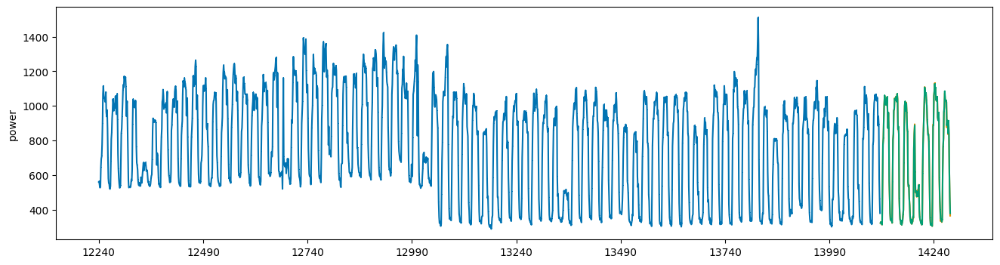

In [11]:
## 주황색이 실제 전력소비량, 초록색이 예측값입니다.
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [12]:
xgb_reg = XGBRegressor(n_estimators=10000, 
                       eta=xgb_params.iloc[47, 1], 
                       min_child_weight=xgb_params.iloc[47, 2], 
                       max_depth=xgb_params.iloc[47, 3], 
                       colsample_bytree=xgb_params.iloc[47, 4], 
                       subsample=xgb_params.iloc[47, 5], 
                       objective='reg:squarederror',  # 목적 함수를 문자열로 지정
                       seed=0)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
            early_stopping_rounds=300,
            verbose=False)

C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eta=0.01, eval_metric=None,
             feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=1, missing=nan,
             monotone_constraints=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None, predictor=None, ...)

best iterations: 9937
SMAPE : 0.23508924944963416


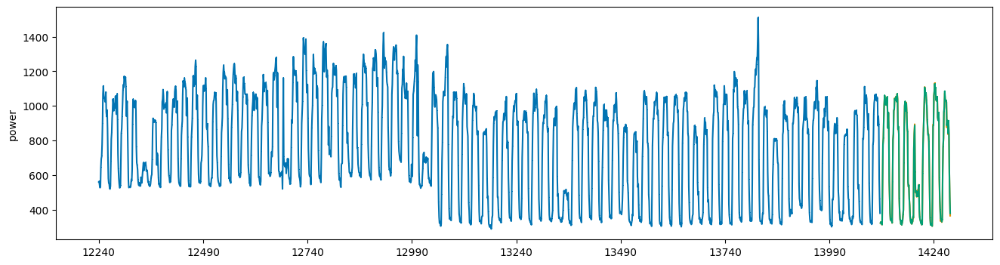

In [13]:
## SMAPE 값으로도, 그래프 상으로도 과소추정이 모델이 개선되었음을 확인
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [14]:
print(x_train.shape, y_train.shape, x_valid.shape, y_valid.shape)
print(x_train)


(1872, 15) (1872,) (168, 15) (168,)
       prec  wind   hum   power  day  month  week  day_hour_mean   hour_mean  \
12240   NaN   1.0  48.0  560.16    2      6    22     440.640000  436.581176   
12241   NaN   1.2  50.0  563.28    2      6    22     442.744615  435.297882   
12242   NaN   1.7  49.0  541.68    2      6    22     434.658462  432.032471   
12243   NaN   0.4  54.0  526.56    2      6    22     426.793846  422.343529   
12244   NaN   2.6  53.0  532.32    2      6    22     428.252308  423.776471   
...     ...   ...   ...     ...  ...    ...   ...            ...         ...   
14107   NaN   2.0  74.0  938.40    2      8    33     954.443077  866.631529   
14108   NaN   2.7  79.0  893.04    2      8    33     931.716923  859.479529   
14109   NaN   1.2  85.0  576.96    2      8    33     686.547692  656.968941   
14110   NaN   1.5  86.0  460.80    2      8    33     539.353846  534.687529   
14111   NaN   0.8  86.0  379.20    2      8    33     457.606154  465.086118   

   

In [15]:
print(y_train)


12240    560.16
12241    563.28
12242    541.68
12243    526.56
12244    532.32
          ...  
14107    938.40
14108    893.04
14109    576.96
14110    460.80
14111    379.20
Name: power, Length: 1872, dtype: float64


In [16]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

param_dist = {
    'n_estimators': randint(100, 500),               # 100에서 500까지의 정수 중 랜덤하게 선택
    'eta': uniform(0.001, 0.1),                       # 0.001에서 0.1 사이의 균등 분포에서 랜덤하게 선택
    'min_child_weight': randint(1, 10),               # 1에서 10까지의 정수 중 랜덤하게 선택
    'max_depth': randint(3, 10),                      # 3에서 10까지의 정수 중 랜덤하게 선택
    'colsample_bytree': uniform(0.6, 0.4),            # 0.6에서 1.0 사이의 균등 분포에서 랜덤하게 선택
    'subsample': uniform(0.6, 0.4)                    # 0.6에서 1.0 사이의 균등 분포에서 랜덤하게 선택
}

best_params_list = []
best_smape_list = []

for i in tqdm(np.arange(1, 101)):
    y = train.loc[train.num == i, 'power']
    x = train.loc[train.num == i, ].iloc[:, 3:]

    # 직접 전체 데이터를 훈련 및 테스트 세트로 분할합니다.
    x_train, x_valid, y_train, y_valid = x.iloc[:-168], x.iloc[-168:], y.iloc[:-168], y.iloc[-168:]

    xgb = XGBRegressor(seed=0, tree_method='hist')
    rs = RandomizedSearchCV(xgb, param_distributions=param_dist, n_iter=50, scoring=SMAPE, cv=5, verbose=1, random_state=0)
    rs.fit(x_train, y_train)

    best_params = rs.best_params_
    best_model = rs.best_estimator_

    pred = best_model.predict(x_valid)
    smape_score = SMAPE(y_valid, pred)

    best_params_list.append(best_params)
    best_smape_list.append(smape_score)

    building = '건물' + str(i)
    print(building + ' || SMAPE: {:.4f}'.format(smape_score))

# 최적의 하이퍼파라미터와 각 건물별 최적의 SMAPE 값을 확인합니다.
for i, params in enumerate(best_params_list):
    print(f'건물{i+1} || 최적 하이퍼파라미터: {params} || 최적 SMAPE: {best_smape_list[i]:.4f}')

  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 5 folds for each of 50 candidates, totalling 250 fits


C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
TypeError: SMAPE() takes 2 positional arguments but 3 were given

  warnings.warn(
C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan na

건물1 || SMAPE: 0.2011
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  2%|▏         | 2/100 [02:36<2:07:37, 78.14s/it]

건물2 || SMAPE: 0.2455
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  3%|▎         | 3/100 [03:53<2:05:48, 77.82s/it]

건물3 || SMAPE: 0.3921
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  4%|▍         | 4/100 [05:08<2:02:27, 76.54s/it]

건물4 || SMAPE: 0.1481
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  5%|▌         | 5/100 [06:26<2:02:21, 77.28s/it]

건물5 || SMAPE: 0.2636
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  6%|▌         | 6/100 [07:43<2:00:55, 77.18s/it]

건물6 || SMAPE: 0.1757
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  7%|▋         | 7/100 [09:01<1:59:36, 77.17s/it]

건물7 || SMAPE: 0.2580
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  8%|▊         | 8/100 [10:13<1:56:13, 75.80s/it]

건물8 || SMAPE: 0.0983
Fitting 5 folds for each of 50 candidates, totalling 250 fits


  9%|▉         | 9/100 [11:32<1:56:12, 76.62s/it]

건물9 || SMAPE: 0.2040
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 10%|█         | 10/100 [12:45<1:53:11, 75.46s/it]

건물10 || SMAPE: 0.1534
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 11%|█         | 11/100 [13:55<1:49:24, 73.75s/it]

건물11 || SMAPE: 0.1000
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 12%|█▏        | 12/100 [15:10<1:48:52, 74.23s/it]

건물12 || SMAPE: 0.1084
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 13%|█▎        | 13/100 [16:22<1:46:49, 73.67s/it]

건물13 || SMAPE: 0.0899
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 14%|█▍        | 14/100 [17:39<1:46:49, 74.53s/it]

건물14 || SMAPE: 0.1943
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 15%|█▌        | 15/100 [18:54<1:45:55, 74.77s/it]

건물15 || SMAPE: 0.1317
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 16%|█▌        | 16/100 [20:10<1:45:19, 75.23s/it]

건물16 || SMAPE: 0.1866
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 17%|█▋        | 17/100 [21:26<1:44:18, 75.40s/it]

건물17 || SMAPE: 0.3641
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 18%|█▊        | 18/100 [22:43<1:43:42, 75.89s/it]

건물18 || SMAPE: 0.4638
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 19%|█▉        | 19/100 [24:00<1:42:46, 76.13s/it]

건물19 || SMAPE: 0.5348
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 20%|██        | 20/100 [25:15<1:41:05, 75.82s/it]

건물20 || SMAPE: 0.4110
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 21%|██        | 21/100 [26:31<1:39:52, 75.85s/it]

건물21 || SMAPE: 0.2133
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 22%|██▏       | 22/100 [27:42<1:36:39, 74.35s/it]

건물22 || SMAPE: 0.1073
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 23%|██▎       | 23/100 [28:53<1:34:12, 73.41s/it]

건물23 || SMAPE: 0.0937
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 24%|██▍       | 24/100 [30:09<1:33:46, 74.03s/it]

건물24 || SMAPE: 0.1593
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 25%|██▌       | 25/100 [31:19<1:31:14, 73.00s/it]

건물25 || SMAPE: 0.1750
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 26%|██▌       | 26/100 [32:06<1:20:22, 65.16s/it]

건물26 || SMAPE: 0.1537
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 27%|██▋       | 27/100 [32:53<1:12:30, 59.59s/it]

건물27 || SMAPE: 0.1927
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 28%|██▊       | 28/100 [33:40<1:07:01, 55.85s/it]

건물28 || SMAPE: 0.2198
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 29%|██▉       | 29/100 [34:27<1:02:53, 53.15s/it]

건물29 || SMAPE: 0.1895
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 30%|███       | 30/100 [35:14<59:58, 51.40s/it]  

건물30 || SMAPE: 0.3722
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 31%|███       | 31/100 [36:01<57:31, 50.02s/it]

건물31 || SMAPE: 0.2357
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 32%|███▏      | 32/100 [36:41<53:31, 47.23s/it]

건물32 || SMAPE: 0.0137
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 33%|███▎      | 33/100 [37:22<50:34, 45.30s/it]

건물33 || SMAPE: 0.0133
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 34%|███▍      | 34/100 [38:03<48:20, 43.94s/it]

건물34 || SMAPE: 0.0262
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 35%|███▌      | 35/100 [38:43<46:24, 42.84s/it]

건물35 || SMAPE: 0.0117
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 36%|███▌      | 36/100 [39:23<44:49, 42.02s/it]

건물36 || SMAPE: 0.0098
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 37%|███▋      | 37/100 [40:11<45:50, 43.66s/it]

건물37 || SMAPE: 0.2179
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 38%|███▊      | 38/100 [41:00<46:53, 45.38s/it]

건물38 || SMAPE: 0.2243
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 39%|███▉      | 39/100 [41:49<47:13, 46.46s/it]

건물39 || SMAPE: 0.2051
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 40%|████      | 40/100 [42:38<47:11, 47.18s/it]

건물40 || SMAPE: 0.4234
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 41%|████      | 41/100 [43:27<46:50, 47.63s/it]

건물41 || SMAPE: 0.2227
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 42%|████▏     | 42/100 [44:15<46:09, 47.74s/it]

건물42 || SMAPE: 0.8042
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 43%|████▎     | 43/100 [45:03<45:32, 47.94s/it]

건물43 || SMAPE: 0.2747
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 44%|████▍     | 44/100 [45:51<44:47, 47.99s/it]

건물44 || SMAPE: 0.2547
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 45%|████▌     | 45/100 [46:39<43:50, 47.82s/it]

건물45 || SMAPE: 0.0997
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 46%|████▌     | 46/100 [47:27<43:04, 47.87s/it]

건물46 || SMAPE: 0.2017
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 47%|████▋     | 47/100 [48:14<42:10, 47.74s/it]

건물47 || SMAPE: 0.1685
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 48%|████▊     | 48/100 [49:01<41:05, 47.41s/it]

건물48 || SMAPE: 0.1255
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 49%|████▉     | 49/100 [49:47<39:53, 46.94s/it]

건물49 || SMAPE: 0.0718
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 50%|█████     | 50/100 [50:33<38:58, 46.77s/it]

건물50 || SMAPE: 0.1360
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 51%|█████     | 51/100 [51:21<38:22, 46.99s/it]

건물51 || SMAPE: 0.1885
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 52%|█████▏    | 52/100 [52:08<37:48, 47.25s/it]

건물52 || SMAPE: 0.1911
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 53%|█████▎    | 53/100 [52:59<37:42, 48.13s/it]

건물53 || SMAPE: 0.4965
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 54%|█████▍    | 54/100 [53:50<37:40, 49.13s/it]

건물54 || SMAPE: 1.5956
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 55%|█████▌    | 55/100 [54:33<35:24, 47.21s/it]

건물55 || SMAPE: 0.0545
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 56%|█████▌    | 56/100 [55:14<33:19, 45.43s/it]

건물56 || SMAPE: 0.0368
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 57%|█████▋    | 57/100 [56:03<33:20, 46.51s/it]

건물57 || SMAPE: 0.1738
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 58%|█████▊    | 58/100 [56:43<31:14, 44.63s/it]

건물58 || SMAPE: 0.0172
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 59%|█████▉    | 59/100 [57:31<31:04, 45.48s/it]

건물59 || SMAPE: 0.2059
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 60%|██████    | 60/100 [58:19<30:53, 46.35s/it]

건물60 || SMAPE: 0.2239
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 61%|██████    | 61/100 [59:07<30:28, 46.89s/it]

건물61 || SMAPE: 0.2047
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 62%|██████▏   | 62/100 [59:57<30:12, 47.71s/it]

건물62 || SMAPE: 0.2307
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 63%|██████▎   | 63/100 [1:00:46<29:38, 48.07s/it]

건물63 || SMAPE: 0.2740
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 64%|██████▍   | 64/100 [1:01:34<28:53, 48.15s/it]

건물64 || SMAPE: 0.2349
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 65%|██████▌   | 65/100 [1:02:22<28:03, 48.11s/it]

건물65 || SMAPE: 0.6411
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 66%|██████▌   | 66/100 [1:03:10<27:09, 47.92s/it]

건물66 || SMAPE: 0.1545
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 67%|██████▋   | 67/100 [1:03:57<26:18, 47.82s/it]

건물67 || SMAPE: 0.5293
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 68%|██████▊   | 68/100 [1:04:46<25:35, 47.98s/it]

건물68 || SMAPE: 0.2360
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 69%|██████▉   | 69/100 [1:05:32<24:30, 47.45s/it]

건물69 || SMAPE: 0.1174
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 70%|███████   | 70/100 [1:06:20<23:51, 47.72s/it]

건물70 || SMAPE: 0.2735
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 71%|███████   | 71/100 [1:07:06<22:51, 47.30s/it]

건물71 || SMAPE: 0.2918
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 72%|███████▏  | 72/100 [1:07:51<21:39, 46.40s/it]

건물72 || SMAPE: 0.1067
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 73%|███████▎  | 73/100 [1:08:38<21:02, 46.76s/it]

건물73 || SMAPE: 0.0822
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 74%|███████▍  | 74/100 [1:09:43<22:34, 52.09s/it]

건물74 || SMAPE: 0.1947
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 75%|███████▌  | 75/100 [1:10:59<24:41, 59.26s/it]

건물75 || SMAPE: 0.1443
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 76%|███████▌  | 76/100 [1:12:14<25:35, 63.99s/it]

건물76 || SMAPE: 0.1553
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 77%|███████▋  | 77/100 [1:13:32<26:11, 68.32s/it]

건물77 || SMAPE: 0.2184
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 78%|███████▊  | 78/100 [1:14:24<23:14, 63.37s/it]

건물78 || SMAPE: 0.3631
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 79%|███████▉  | 79/100 [1:15:12<20:33, 58.71s/it]

건물79 || SMAPE: 0.1555
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 80%|████████  | 80/100 [1:16:00<18:28, 55.44s/it]

건물80 || SMAPE: 0.3397
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 81%|████████  | 81/100 [1:16:49<16:57, 53.53s/it]

건물81 || SMAPE: 0.1844
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 82%|████████▏ | 82/100 [1:17:37<15:36, 52.01s/it]

건물82 || SMAPE: 0.3877
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 83%|████████▎ | 83/100 [1:18:26<14:24, 50.88s/it]

건물83 || SMAPE: 0.3734
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 84%|████████▍ | 84/100 [1:19:14<13:23, 50.22s/it]

건물84 || SMAPE: 0.3305
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 85%|████████▌ | 85/100 [1:20:01<12:17, 49.13s/it]

건물85 || SMAPE: 0.1302
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 86%|████████▌ | 86/100 [1:20:50<11:27, 49.11s/it]

건물86 || SMAPE: 0.2231
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 87%|████████▋ | 87/100 [1:21:42<10:49, 49.95s/it]

건물87 || SMAPE: 0.3175
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 88%|████████▊ | 88/100 [1:22:31<09:57, 49.81s/it]

건물88 || SMAPE: 0.4373
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 89%|████████▉ | 89/100 [1:23:21<09:07, 49.73s/it]

건물89 || SMAPE: 0.4179
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 90%|█████████ | 90/100 [1:24:11<08:18, 49.88s/it]

건물90 || SMAPE: 0.2673
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 91%|█████████ | 91/100 [1:25:00<07:25, 49.45s/it]

건물91 || SMAPE: 0.2454
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 92%|█████████▏| 92/100 [1:25:48<06:32, 49.12s/it]

건물92 || SMAPE: 0.3198
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 93%|█████████▎| 93/100 [1:26:36<05:40, 48.70s/it]

건물93 || SMAPE: 0.1931
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 94%|█████████▍| 94/100 [1:27:24<04:52, 48.74s/it]

건물94 || SMAPE: 0.2067
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 95%|█████████▌| 95/100 [1:28:12<04:02, 48.43s/it]

건물95 || SMAPE: 0.3524
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 96%|█████████▌| 96/100 [1:28:59<03:11, 47.83s/it]

건물96 || SMAPE: 0.1545
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 97%|█████████▋| 97/100 [1:29:46<02:23, 47.73s/it]

건물97 || SMAPE: 0.2131
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 98%|█████████▊| 98/100 [1:30:35<01:36, 48.11s/it]

건물98 || SMAPE: 0.3573
Fitting 5 folds for each of 50 candidates, totalling 250 fits


 99%|█████████▉| 99/100 [1:31:23<00:47, 47.90s/it]

건물99 || SMAPE: 0.2251
Fitting 5 folds for each of 50 candidates, totalling 250 fits


100%|██████████| 100/100 [1:32:13<00:00, 55.33s/it]

건물100 || SMAPE: 0.1839
건물1 || 최적 하이퍼파라미터: {'colsample_bytree': 0.8195254015709299, 'eta': 0.07251893663724195, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 459, 'subsample': 0.7694619197355619} || 최적 SMAPE: 0.2011
건물2 || 최적 하이퍼파라미터: {'colsample_bytree': 0.8195254015709299, 'eta': 0.07251893663724195, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 459, 'subsample': 0.7694619197355619} || 최적 SMAPE: 0.2455
건물3 || 최적 하이퍼파라미터: {'colsample_bytree': 0.8195254015709299, 'eta': 0.07251893663724195, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 459, 'subsample': 0.7694619197355619} || 최적 SMAPE: 0.3921
건물4 || 최적 하이퍼파라미터: {'colsample_bytree': 0.8195254015709299, 'eta': 0.07251893663724195, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 459, 'subsample': 0.7694619197355619} || 최적 SMAPE: 0.1481
건물5 || 최적 하이퍼파라미터: {'colsample_bytree': 0.8195254015709299, 'eta': 0.07251893663724195, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 459, 'subsample': 0.7694619197

In [17]:
xgb_params = pd.read_csv('./hyperparameter_xgb.csv')


In [18]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(100)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)
    
    xgb_reg = XGBRegressor(n_estimators = 10000, eta = 0.001, min_child_weight = xgb_params.iloc[i, 2],
                           max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
                           subsample = xgb_params.iloc[i, 5], seed=0)
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_valid)
    pred = pd.Series(y_pred)   
    
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration+1) ## 실제 best iteration은 이 값에 +1 해주어야 함.

  0%|          | 0/100 [00:00<?, ?it/s]C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
100%|██████████| 100/100 [20:58<00:00, 12.59s/it]


In [19]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Standard Scaling
scaler_standard = StandardScaler()
x_train = scaler_standard.fit_transform(x_train)
x_valid = scaler_standard.transform(x_valid)



In [20]:
alpha_list = []
smape_list = []
for i in tqdm(range(100)):
    y = train.loc[train.num == i+1, 'power']
    x = train.loc[train.num == i+1, ].iloc[:, 3:]
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.001, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
    
    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.001, min_child_weight = xgb_params.iloc[i, 2],
                      max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], subsample = xgb_params.iloc[i, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})
    
        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

  1%|          | 1/100 [01:24<2:20:08, 84.93s/it]

building 1 || best score : 0.5388349443330808 || alpha : 1


  2%|▏         | 2/100 [02:31<2:00:42, 73.90s/it]

building 2 || best score : 0.9507810698839171 || alpha : 100


  3%|▎         | 3/100 [03:33<1:51:01, 68.67s/it]

building 3 || best score : 0.9177303027744119 || alpha : 3


  4%|▍         | 4/100 [04:54<1:57:24, 73.38s/it]

building 4 || best score : 0.3466715851579167 || alpha : 1


  5%|▌         | 5/100 [06:29<2:08:31, 81.18s/it]

building 5 || best score : 0.4334880874643283 || alpha : 3


  6%|▌         | 6/100 [08:07<2:16:28, 87.11s/it]

building 6 || best score : 0.34733211981218337 || alpha : 100


  7%|▋         | 7/100 [09:46<2:20:58, 90.95s/it]

building 7 || best score : 0.515918611775094 || alpha : 1


  8%|▊         | 8/100 [11:18<2:19:56, 91.27s/it]

building 8 || best score : 0.27456798432098845 || alpha : 1


  9%|▉         | 9/100 [12:52<2:19:34, 92.02s/it]

building 9 || best score : 0.26831718139119903 || alpha : 0


 10%|█         | 10/100 [14:06<2:09:47, 86.53s/it]

building 10 || best score : 0.47620754497748236 || alpha : 1


 11%|█         | 11/100 [15:38<2:10:53, 88.25s/it]

building 11 || best score : 0.23853016104775174 || alpha : 100


 12%|█▏        | 12/100 [17:26<2:18:20, 94.32s/it]

building 12 || best score : 0.20979050805439384 || alpha : 1


 13%|█▎        | 13/100 [19:06<2:18:58, 95.84s/it]

building 13 || best score : 0.2208321137673561 || alpha : 100


 14%|█▍        | 14/100 [20:18<2:07:20, 88.84s/it]

building 14 || best score : 0.6130428989588383 || alpha : 0


 15%|█▌        | 15/100 [21:53<2:08:22, 90.61s/it]

building 15 || best score : 0.28022250352256806 || alpha : 100


 16%|█▌        | 16/100 [23:10<2:01:13, 86.59s/it]

building 16 || best score : 0.34250060811380606 || alpha : 50


 17%|█▋        | 17/100 [24:49<2:04:43, 90.16s/it]

building 17 || best score : 0.4907888965081816 || alpha : 10


 18%|█▊        | 18/100 [26:25<2:05:50, 92.07s/it]

building 18 || best score : 0.5218973596222745 || alpha : 25


 19%|█▉        | 19/100 [28:56<2:28:13, 109.79s/it]

building 19 || best score : 0.6391614550613043 || alpha : 3


 20%|██        | 20/100 [31:32<2:44:46, 123.58s/it]

building 20 || best score : 0.290290041523928 || alpha : 5


 21%|██        | 21/100 [33:07<2:31:12, 114.84s/it]

building 21 || best score : 0.38892548016829104 || alpha : 100


 22%|██▏       | 22/100 [34:41<2:21:25, 108.78s/it]

building 22 || best score : 0.30174671900771394 || alpha : 5


 23%|██▎       | 23/100 [37:18<2:38:09, 123.23s/it]

building 23 || best score : 0.13889128050563218 || alpha : 7


 24%|██▍       | 24/100 [38:53<2:25:20, 114.75s/it]

building 24 || best score : 0.24038471823461757 || alpha : 100


 25%|██▌       | 25/100 [40:49<2:23:51, 115.08s/it]

building 25 || best score : 0.20381566891160863 || alpha : 50


 26%|██▌       | 26/100 [42:22<2:13:55, 108.59s/it]

building 26 || best score : 0.2618981491093677 || alpha : 100


 27%|██▋       | 27/100 [43:50<2:04:31, 102.34s/it]

building 27 || best score : 0.23167147013632367 || alpha : 100


 28%|██▊       | 28/100 [44:59<1:50:52, 92.40s/it] 

building 28 || best score : 0.4922549481142496 || alpha : 3


 29%|██▉       | 29/100 [47:36<2:12:07, 111.65s/it]

building 29 || best score : 0.2340587643804306 || alpha : 3


 30%|███       | 30/100 [49:07<2:03:09, 105.56s/it]

building 30 || best score : 0.4540469062881779 || alpha : 3


 31%|███       | 31/100 [50:23<1:50:58, 96.50s/it] 

building 31 || best score : 0.4832094644542896 || alpha : 75


 32%|███▏      | 32/100 [52:24<1:57:50, 103.98s/it]

building 32 || best score : 0.025436498435041886 || alpha : 0


 33%|███▎      | 33/100 [54:35<2:05:00, 111.95s/it]

building 33 || best score : 0.019583145929045132 || alpha : 0


 34%|███▍      | 34/100 [56:41<2:07:47, 116.17s/it]

building 34 || best score : 0.0402274528148706 || alpha : 1


 35%|███▌      | 35/100 [58:57<2:12:16, 122.10s/it]

building 35 || best score : 0.019707570322486115 || alpha : 1


 36%|███▌      | 36/100 [1:01:29<2:20:02, 131.29s/it]

building 36 || best score : 0.017880201605600617 || alpha : 1


 37%|███▋      | 37/100 [1:03:01<2:05:15, 119.29s/it]

building 37 || best score : 0.32435918300495087 || alpha : 100


 38%|███▊      | 38/100 [1:04:27<1:53:06, 109.46s/it]

building 38 || best score : 0.3811681070013632 || alpha : 5


 39%|███▉      | 39/100 [1:06:07<1:48:30, 106.72s/it]

building 39 || best score : 0.33202487503517336 || alpha : 25


 40%|████      | 40/100 [1:07:21<1:36:49, 96.83s/it] 

building 40 || best score : 0.7873282878288667 || alpha : 100


 41%|████      | 41/100 [1:08:57<1:34:50, 96.45s/it]

building 41 || best score : 0.3553066300157423 || alpha : 25


 42%|████▏     | 42/100 [1:11:34<1:50:45, 114.58s/it]

building 42 || best score : 0.7900338243792114 || alpha : 3


 43%|████▎     | 43/100 [1:13:00<1:40:54, 106.21s/it]

building 43 || best score : 0.49604954411262187 || alpha : 0


 44%|████▍     | 44/100 [1:14:28<1:33:49, 100.52s/it]

building 44 || best score : 0.389774452308892 || alpha : 0


 45%|████▌     | 45/100 [1:17:24<1:52:52, 123.14s/it]

building 45 || best score : 0.1887100801918955 || alpha : 100


 46%|████▌     | 46/100 [1:19:48<1:56:38, 129.61s/it]

building 46 || best score : 0.38097980404233006 || alpha : 25


 47%|████▋     | 47/100 [1:22:21<2:00:39, 136.59s/it]

building 47 || best score : 0.3671052726406606 || alpha : 75


 48%|████▊     | 48/100 [1:24:56<2:03:11, 142.15s/it]

building 48 || best score : 0.18441529920227717 || alpha : 100


 49%|████▉     | 49/100 [1:27:46<2:07:49, 150.39s/it]

building 49 || best score : 0.1394477036679337 || alpha : 75


 50%|█████     | 50/100 [1:30:11<2:04:00, 148.81s/it]

building 50 || best score : 0.1830847945251402 || alpha : 100


 51%|█████     | 51/100 [1:32:52<2:04:37, 152.61s/it]

building 51 || best score : 0.30265990009640203 || alpha : 100


 52%|█████▏    | 52/100 [1:36:09<2:12:34, 165.71s/it]

building 52 || best score : 0.24394583967208205 || alpha : 10


 53%|█████▎    | 53/100 [1:38:11<1:59:30, 152.56s/it]

building 53 || best score : 0.585073249759002 || alpha : 1


 54%|█████▍    | 54/100 [1:41:22<2:06:00, 164.35s/it]

building 54 || best score : 1.7517085373560088 || alpha : 100


 55%|█████▌    | 55/100 [1:44:21<2:06:21, 168.48s/it]

building 55 || best score : 0.12743399151913787 || alpha : 25


 56%|█████▌    | 56/100 [1:47:47<2:11:48, 179.74s/it]

building 56 || best score : 0.054904452357737055 || alpha : 100


 57%|█████▋    | 57/100 [1:50:14<2:01:54, 170.11s/it]

building 57 || best score : 0.3524491368272063 || alpha : 50


 58%|█████▊    | 58/100 [1:53:59<2:10:35, 186.55s/it]

building 58 || best score : 0.02093968014276646 || alpha : 0


 59%|█████▉    | 59/100 [1:56:23<1:58:46, 173.82s/it]

building 59 || best score : 0.43653630325630205 || alpha : 3


 60%|██████    | 60/100 [1:58:38<1:48:01, 162.03s/it]

building 60 || best score : 0.43408470867690746 || alpha : 50


 61%|██████    | 61/100 [2:00:55<1:40:26, 154.52s/it]

building 61 || best score : 0.3439430424422609 || alpha : 7


 62%|██████▏   | 62/100 [2:03:05<1:33:13, 147.20s/it]

building 62 || best score : 0.4572407791205042 || alpha : 1


 63%|██████▎   | 63/100 [2:04:28<1:18:52, 127.91s/it]

building 63 || best score : 0.5074508093276029 || alpha : 1


 64%|██████▍   | 64/100 [2:06:43<1:18:08, 130.24s/it]

building 64 || best score : 0.40177484307807193 || alpha : 3


 65%|██████▌   | 65/100 [2:08:34<1:12:30, 124.30s/it]

building 65 || best score : 0.8169102463138609 || alpha : 1


 66%|██████▌   | 66/100 [2:11:22<1:17:51, 137.39s/it]

building 66 || best score : 0.30371156862720483 || alpha : 3


 67%|██████▋   | 67/100 [2:13:07<1:10:18, 127.82s/it]

building 67 || best score : 0.6137001993129282 || alpha : 0


 68%|██████▊   | 68/100 [2:15:18<1:08:34, 128.58s/it]

building 68 || best score : 0.40457502148742475 || alpha : 1


 69%|██████▉   | 69/100 [2:17:43<1:09:00, 133.56s/it]

building 69 || best score : 0.2638705012361594 || alpha : 100


 70%|███████   | 70/100 [2:20:51<1:14:57, 149.91s/it]

building 70 || best score : 0.2459477199553151 || alpha : 75


 71%|███████   | 71/100 [2:23:28<1:13:28, 152.02s/it]

building 71 || best score : 0.23616370289631466 || alpha : 50


 72%|███████▏  | 72/100 [2:26:26<1:14:34, 159.81s/it]

building 72 || best score : 0.23598366540019006 || alpha : 100


 73%|███████▎  | 73/100 [2:29:12<1:12:49, 161.84s/it]

building 73 || best score : 0.1640016649524864 || alpha : 25


 74%|███████▍  | 74/100 [2:33:07<1:19:39, 183.82s/it]

building 74 || best score : 0.30998332293445374 || alpha : 5


 75%|███████▌  | 75/100 [2:35:27<1:10:59, 170.38s/it]

building 75 || best score : 0.2802355685796835 || alpha : 100


 76%|███████▌  | 76/100 [2:38:00<1:06:10, 165.42s/it]

building 76 || best score : 0.4144164301832201 || alpha : 100


 77%|███████▋  | 77/100 [2:40:45<1:03:18, 165.16s/it]

building 77 || best score : 0.24360018993746943 || alpha : 100


 78%|███████▊  | 78/100 [2:43:25<1:00:03, 163.78s/it]

building 78 || best score : 0.31177113320449346 || alpha : 100


 79%|███████▉  | 79/100 [2:46:23<58:43, 167.78s/it]  

building 79 || best score : 0.21709476665768473 || alpha : 100


 80%|████████  | 80/100 [2:49:08<55:40, 167.03s/it]

building 80 || best score : 0.34425689439499957 || alpha : 100


 81%|████████  | 81/100 [2:51:40<51:30, 162.65s/it]

building 81 || best score : 0.27735703426490405 || alpha : 10


 82%|████████▏ | 82/100 [2:54:09<47:30, 158.34s/it]

building 82 || best score : 0.3921514023236628 || alpha : 100


 83%|████████▎ | 83/100 [2:56:55<45:31, 160.68s/it]

building 83 || best score : 0.27819183953842497 || alpha : 100


 84%|████████▍ | 84/100 [2:59:25<41:59, 157.49s/it]

building 84 || best score : 0.28627979002786846 || alpha : 100


 85%|████████▌ | 85/100 [3:02:37<41:57, 167.80s/it]

building 85 || best score : 0.22462557620291412 || alpha : 3


 86%|████████▌ | 86/100 [3:05:16<38:35, 165.36s/it]

building 86 || best score : 0.3276917388587429 || alpha : 3


 87%|████████▋ | 87/100 [3:07:41<34:27, 159.02s/it]

building 87 || best score : 0.7235921154090971 || alpha : 3


 88%|████████▊ | 88/100 [3:10:25<32:09, 160.75s/it]

building 88 || best score : 0.39755548040107286 || alpha : 10


 89%|████████▉ | 89/100 [3:13:00<29:09, 159.02s/it]

building 89 || best score : 0.42583796032333354 || alpha : 100


 90%|█████████ | 90/100 [3:15:50<27:01, 162.16s/it]

building 90 || best score : 0.5323147180101797 || alpha : 100


 91%|█████████ | 91/100 [3:20:02<28:22, 189.15s/it]

building 91 || best score : 0.6392856091497829 || alpha : 3


 92%|█████████▏| 92/100 [3:22:45<24:10, 181.27s/it]

building 92 || best score : 0.42655197160580627 || alpha : 3


 93%|█████████▎| 93/100 [3:25:31<20:37, 176.81s/it]

building 93 || best score : 0.5047114026614984 || alpha : 0


 94%|█████████▍| 94/100 [3:28:28<17:40, 176.75s/it]

building 94 || best score : 0.42515515649938385 || alpha : 1


 95%|█████████▌| 95/100 [3:30:05<12:43, 152.79s/it]

building 95 || best score : 1.1063701085602597 || alpha : 1


 96%|█████████▌| 96/100 [3:32:09<09:37, 144.27s/it]

building 96 || best score : 0.34875354251979274 || alpha : 1


 97%|█████████▋| 97/100 [3:35:12<07:47, 155.79s/it]

building 97 || best score : 0.348085196012683 || alpha : 1


 98%|█████████▊| 98/100 [3:37:09<04:48, 144.11s/it]

building 98 || best score : 1.1011124490643045 || alpha : 1


 99%|█████████▉| 99/100 [3:39:41<02:26, 146.69s/it]

building 99 || best score : 0.3777403082349189 || alpha : 1


100%|██████████| 100/100 [3:42:19<00:00, 133.40s/it]

building 100 || best score : 0.3862566239178876 || alpha : 3


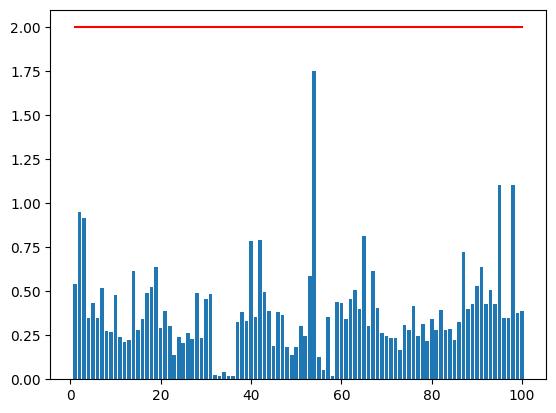

In [21]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,100], [2, 2], color = 'red')

In [22]:
# train set과 동일한 전처리 과정
test = pd.read_csv('./test.csv', encoding='utf-8')

# cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']

test = test.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
date = pd.to_datetime(test.date_time)
test['hour'] = date.dt.hour
test['day'] = date.dt.weekday
test['month'] = date.dt.month
test['week'] = date.dt.weekofyear
test['sin_time'] = np.sin(2*np.pi*test.hour/24)
test['cos_time'] = np.cos(2*np.pi*test.hour/24)
test['holiday'] = test.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
test.loc[('2022-08-15'<=test.date_time)&(test.date_time<'2022-08-16'), 'holiday'] = 1

## 건물별 일별 시간별 발전량 평균
tqdm.pandas()
test['day_hour_mean'] = test.progress_apply(lambda x : power_mean.loc[(power_mean.num == x['num']) & (power_mean.day == x['day']) & (power_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

## 건물별 시간별 발전량 평균 넣어주기
tqdm.pandas()
test['hour_mean'] = test.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.num == x['num']) & (power_hour_mean.hour == x['hour']) ,'power'].values[0], axis = 1)

tqdm.pandas()
test['hour_std'] = test.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.num == x['num']) & (power_hour_std.hour == x['hour']) ,'power'].values[0], axis = 1)

test.drop(['hour','date_time'], axis = 1, inplace = True)

# pandas 내 선형보간 method 사용
for i in range(100):
    test.iloc[i*168:(i+1)*168, :]  = test.iloc[i*168:(i+1)*168, :].interpolate()


test['THI'] = 9/5*test['temp'] - 0.55*(1-test['hum']/100)*(9/5*test['hum']-26)+32

cdhs = np.array([])
for num in range(1,101,1):
    temp = test[test['num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
test['CDH'] = cdhs

test = test[['num','temp', 'wind', 'hum', 'prec',  'day', 'month', 'week',
       'day_hour_mean', 'hour_mean', 'hour_std', 'holiday', 'sin_time',
       'cos_time', 'THI', 'CDH']]
test['power'] = np.nan

test.head()



C:\Users\wkdal\AppData\Local\Temp\ipykernel_7972\3135516162.py:21: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  test['week'] = date.dt.weekofyear
100%|██████████| 16800/16800 [00:09<00:00, 1734.67it/s]


,num,temp,wind,hum,prec,day,month,week,day_hour_mean,hour_mean,hour_std,holiday,sin_time,cos_time,THI,CDH,power
0,1,23.5,2.2,72,0.0,3,8,34,1627.80,1706.318118,446.882767,0,0.000000,1.000000,58.3456,-2.5,NaN
1,1,23.0,0.9,72,0.0,3,8,34,1550.08,1622.620235,439.662704,0,0.258819,0.965926,57.4456,-5.5,NaN
2,1,22.7,1.5,75,0.0,3,8,34,1431.12,1506.971294,412.071906,0,0.500000,0.866025,57.8725,-8.8,NaN
3,1,22.1,1.3,78,0.0,3,8,34,1372.20,1437.365647,391.205981,0,0.707107,0.707107,57.9376,-12.7,NaN
4,1,21.8,1.0,77,0.0,3,8,34,1381.72,1447.321412,381.099697,0,0.866025,0.500000,56.9961,-16.9,NaN


In [23]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,1,3,0.8,0.8,1,5359
1,100,0.01,1,3,0.8,0.8,100,4149
2,100,0.01,1,3,0.8,0.8,3,3912
3,100,0.01,1,3,0.8,0.8,1,5070
4,100,0.01,1,3,0.8,0.8,3,6026


In [24]:
xgb_params.to_csv('./hyperparameter_xgb_final.csv', index=False)


In [25]:
## best hyperparameters 불러오기
xgb_params = pd.read_csv('./hyperparameter_xgb_final.csv')
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,1,3,0.8,0.8,1,5359
1,100,0.01,1,3,0.8,0.8,100,4149
2,100,0.01,1,3,0.8,0.8,3,3912
3,100,0.01,1,3,0.8,0.8,1,5070
4,100,0.01,1,3,0.8,0.8,3,6026


In [26]:
best_it = xgb_params['best_it'].to_list()
best_it[0]        # 1051

5359

In [27]:
preds = np.array([])  

for i in tqdm(range(100)):
    
    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
    
    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = train.loc[train.num == i+1, 'power']
        x_train, x_test = train.loc[train.num == i+1, ].iloc[:, 3:], test.loc[test.num == i+1, ].iloc[:,1:]
        x_test = x_test[x_train.columns]
        
        xgb = XGBRegressor(seed = seed, n_estimators = best_it[i], eta = 0.001, 
                           min_child_weight = xgb_params.iloc[i, 2], max_depth = xgb_params.iloc[i, 3], 
                           colsample_bytree=xgb_params.iloc[i, 4], subsample=xgb_params.iloc[i, 5])
    
        if xgb_params.iloc[i,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i,6])})
        
        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기
        
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)   

100%|██████████| 100/100 [2:27:26<00:00, 88.47s/it]  


In [1]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = train.loc[train.num == i+1, 'power'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.num == i+1, 'power'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
#plt.savefig('./predict_xgb.png')
plt.show()

NameError: name 'pd' is not defined

In [29]:
submission = pd.read_csv('./sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./submission_xgb_noclip.csv', index = False)

In [30]:
train_to_post = pd.read_csv('./train.csv', encoding = 'utf-8')
# cols = ['num', 'date_time', 'power', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
train_to_post = train_to_post.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})
date = pd.to_datetime(train_to_post.date_time)
train_to_post['hour'] = date.dt.hour
train_to_post['day'] = date.dt.weekday
train_to_post['month'] = date.dt.month
train_to_post['week'] = date.dt.weekofyear
train_to_post = train_to_post.loc[(('2022-08-15'>train_to_post.date_time)|(train_to_post.date_time>='2022-08-16')), ].reset_index(drop = True)

pred_clip = []
test_to_post = pd.read_csv('./test.csv',  encoding = 'utf-8')
# cols = ['num', 'date_time', 'temp', 'wind','hum' ,'prec', 'sun', 'non_elec', 'solar']
test_to_post = test_to_post.rename(columns={
    '건물번호': 'num',
    '일시': 'date_time',
    '기온(C)': 'temp',
    '강수량(mm)': 'prec',
    '풍속(m/s)': 'wind',
    '습도(%)': 'hum',
    '일조(hr)': 'sun',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power'
})

# test_to_post.columns = cols
date = pd.to_datetime(test_to_post.date_time)
test_to_post['hour'] = date.dt.hour
test_to_post['day'] = date.dt.weekday
test_to_post['month'] = date.dt.month
test_to_post['week'] = date.dt.weekofyear

## submission 불러오기
df = pd.read_csv('./submission_xgb_noclip.csv')
for i in range(100):
    min_data = train_to_post.loc[train_to_post.num == i+1, ].iloc[-28*24:, :] ## 건물별로 직전 28일의 데이터 불러오기
    ## 요일별, 시간대별 최솟값 계산
    min_data = pd.pivot_table(min_data, values = 'power', index = ['day', 'hour'], aggfunc = min).reset_index() 
    pred = df.answer[168*i:168*(i+1)].reset_index(drop=True) ## 168개 데이터, 즉 건물별 예측값 불러오기
    day =  test_to_post.day[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 요일 불러오기
    hour = test_to_post.hour[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 시간 불러오기
    df_pred = pd.concat([pred, day, hour], axis = 1)
    df_pred.columns = ['pred', 'day', 'hour']
    for j in range(len(df_pred)):
        min_power = min_data.loc[(min_data.day == df_pred.day[j])&(min_data.hour == df_pred.hour[j]), 'power'].values[0]
        if df_pred.pred[j] < min_power:
            pred_clip.append(min_power)
        else:
            pred_clip.append(df_pred.pred[j])

C:\Users\wkdal\AppData\Local\Temp\ipykernel_7972\3957864043.py:18: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  train_to_post['week'] = date.dt.weekofyear
C:\Users\wkdal\AppData\Local\Temp\ipykernel_7972\3957864043.py:41: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  test_to_post['week'] = date.dt.weekofyear


C:\Users\wkdal\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sktime\utils\plotting.py:112: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, figsize=plt.figaspect(0.25))


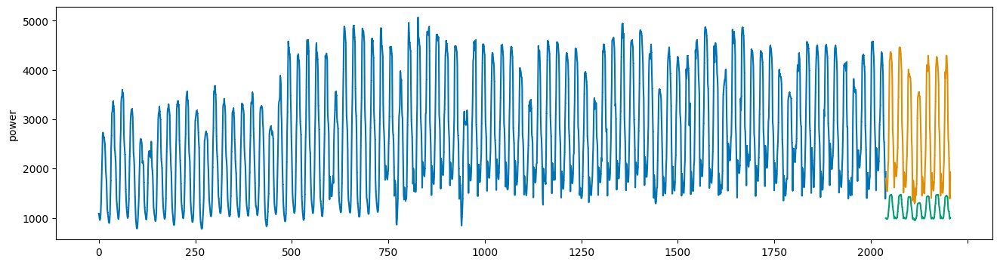

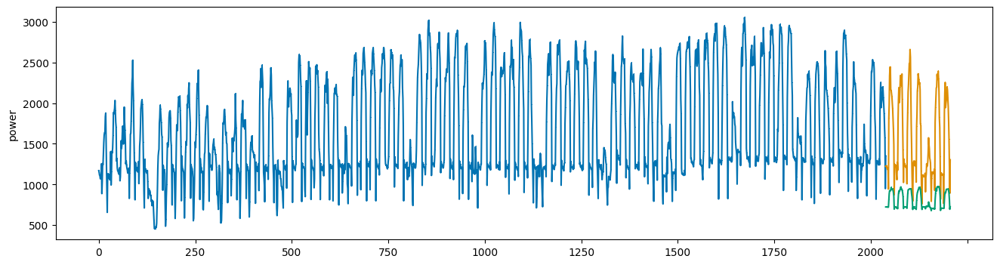

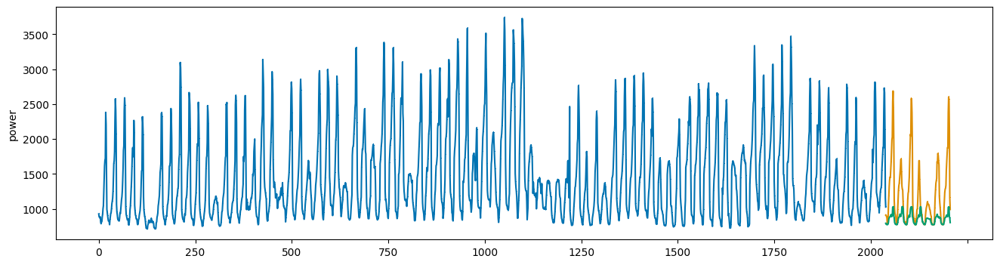

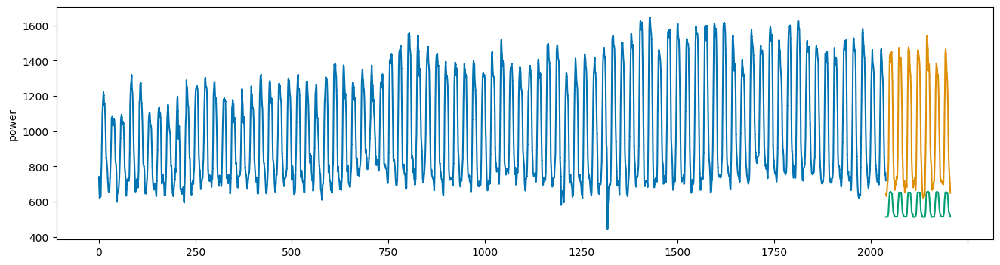

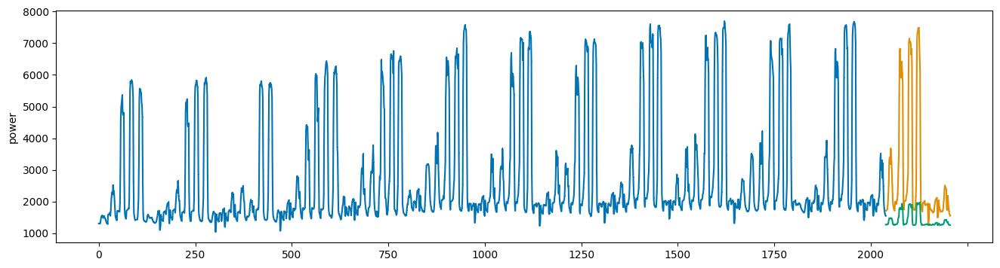

...

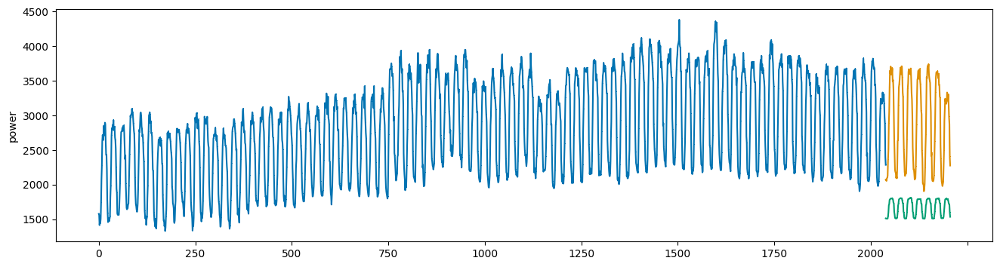

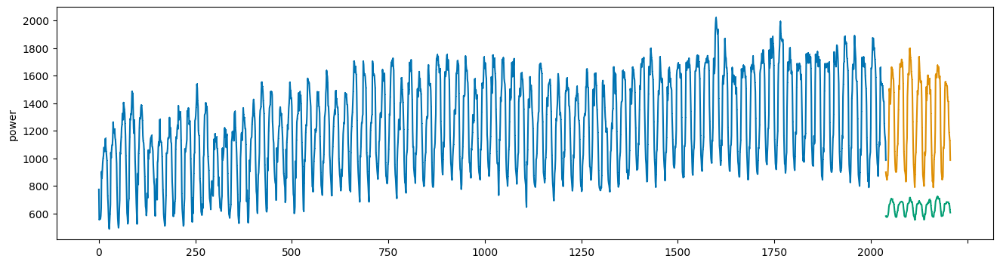

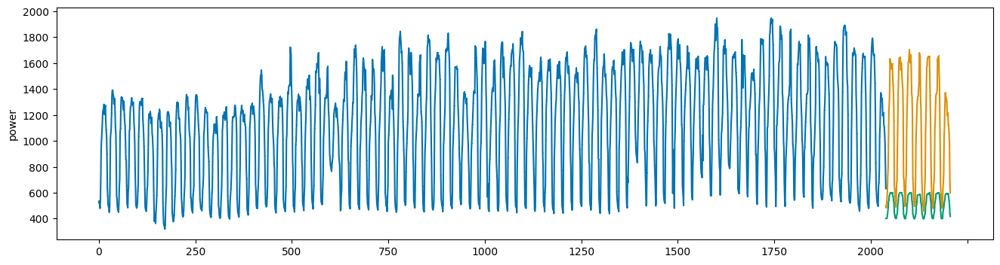

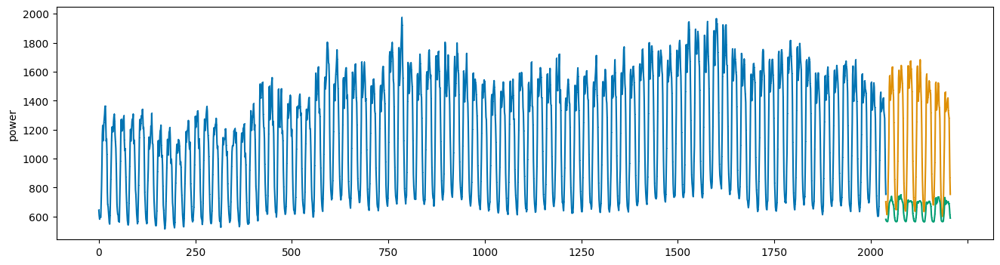

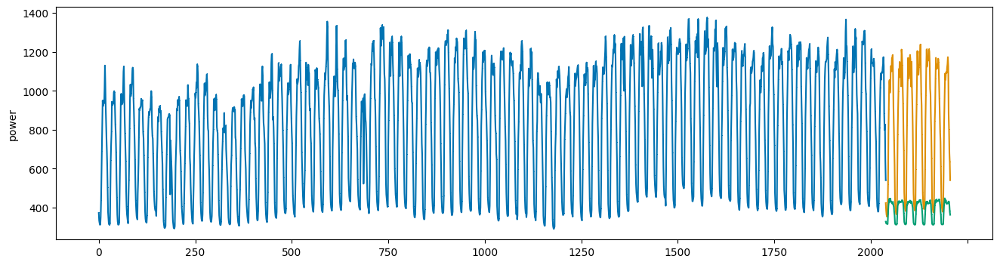

In [31]:
pred_origin = df.answer
pred_clip = pd.Series(pred_clip)

for i in range(100):
    power = train_to_post.loc[train_to_post.num == i+1, 'power'].reset_index(drop=True)
    preds = pred_clip[i*168:(i+1)*168]
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds.index = range(power.index[-1], power.index[-1]+168)
    preds_origin.index = range(power.index[-1], power.index[-1]+168)
    
    plot_series(power, preds,  preds_origin, markers = [',', ',', ','])

In [ ]:
import pandas as pd
import numpy as np
import random
import os

from tqdm import tqdm
from autogluon.tabular import TabularDataset, TabularPredictor


train_df = pd.read_csv('/train.csv')
test_df = pd.read_csv('/test.csv')
sample_submission = pd.read_csv('/sample_submission.csv')
building_df = pd.read_csv('/building_info.csv')

from datetime import datetime, timedelta

def classify_weekdays(start_date, end_date):
    date_format = "%Y-%m-%d"
    start = datetime.strptime(start_date, date_format)
    end = datetime.strptime(end_date, date_format)
    
    classification = []
    current_date = start
    
    while current_date <= end:
        if current_date.weekday() < 5:  # 0: 월요일, 1: 화요일, ..., 4: 금요일
            classification.append(0)  # 평일
        else:
            classification.append(1)  # 주말
        
        current_date += timedelta(days=1)
    
    return classification

# 예시 데이터 프레임 생성
data = {'date': pd.date_range(start='2022-06-01', end='2022-08-24')}
train = pd.DataFrame(data)
t_data = {'date': pd.date_range(start='2022-08-25', end='2022-08-31')}
test = pd.DataFrame(t_data)

# 주말/평일 분류한 결과를 'holidays' 열에 추가
start_date = "2022-06-01"
end_date = "2022-08-24"
test_start_date = "2022-08-25"
test_end_date = "2022-08-31"
train['holidays'] = classify_weekdays(start_date, end_date)
train_df['holidays'] = train['holidays']
test['holidays'] = classify_weekdays(test_start_date, test_end_date)
test_df['holidays'] = test['holidays']
#added
train_df['일시'] = pd.to_datetime(train_df['일시'], format='%Y%m%d %H')
test_df['일시'] = pd.to_datetime(test_df['일시'], format='%Y%m%d %H')

# date time feature 생성
train_df['hour'] = train_df['일시'].dt.hour
train_df['day'] = train_df['일시'].dt.day
train_df['month'] = train_df['일시'].dt.month
train_df['year'] = train_df['일시'].dt.year

test_df['hour'] = test_df['일시'].dt.hour
test_df['day'] = test_df['일시'].dt.day
test_df['month'] = test_df['일시'].dt.month
test_df['year'] = test_df['일시'].dt.year

train_df['sin_time'] = np.sin(2*np.pi*train_df.hour/24)
train_df['cos_time'] = np.cos(2*np.pi*train_df.hour/24)

test_df['sin_time'] = np.sin(2*np.pi*test_df.hour/24)
test_df['cos_time'] = np.cos(2*np.pi*test_df.hour/24)
train_df['THI'] = 9/5*train_df['기온(C)'] - 0.55*(1-train_df['습도(%)']/100)*(9/5*train_df['습도(%)']-26)+32
test_df['THI'] = 9/5*test_df['기온(C)'] - 0.55*(1-test_df['습도(%)']/100)*(9/5*test_df['습도(%)']-26)+32
##############################################################


train_df = train_df.drop(columns = ['일조(hr)', '일사(MJ/m2)', '강수량(mm)', '풍속(m/s)'])
test_df = test_df.drop(columns = ['강수량(mm)', '풍속(m/s)'])
train_data = TabularDataset(train_df)
train_data.head()

label = '전력소비량(kWh)'
####################################################

predictor = TabularPredictor(label=label,problem_type='regression').fit(
                            train_data, presets = ['best_quality'],  auto_stack=True)

test_data = TabularDataset(test_df)

y_pred = predictor.predict(test_data)
x = pd.DataFrame(y_pred)

sample_submission['answer'] = x['전력소비량(kWh)']
print(sample_submission)
sample_submission.to_csv('./baseline_submission.csv', index=False)

In [32]:
submission = pd.read_csv('./sample_submission.csv')
submission['answer'] = pred_clip
submission.to_csv('./submission_xgb_final.csv', index = False)